<a href="https://colab.research.google.com/github/Michal287/computer_vision/blob/main/YoloV8.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Installations

In [ ]:
!pip install -q ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 599.6/599.6 kB 33.9 MB/s eta 0:00:00


# Imports

In [ ]:
from ultralytics import YOLO
from google.colab import drive

ModuleNotFoundError: ignored

In [ ]:
drive.mount('/content/drive')

# Load data

In [ ]:
!7z x /content/drive/MyDrive/yolo_data_stab_13_06_2023.zip

# Load model

In [ ]:
model = YOLO('yolov8n.yaml')
model = YOLO('yolov8n.pt')


                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128

# Train model

In [ ]:
results = model.train(data="/content/data/dataset.yaml",
                      optimizer='SGD', lr0=0.01, lrf=0.001,
                      val=True,
                      epochs=75,
                      imgsz=640, batch=64,
                      hsv_h=0.02, degrees=0.45, flipud=0.2)

Ultralytics YOLOv8.0.117 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
yolo/engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/data/dataset.yaml, epochs=75, patience=50, batch=64, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=False, optimizer=SGD, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=0, resume=False, amp=True, fraction=1.0, profile=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, line_width=None, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchscript, keras=False, optimize=False, int8=False, dynamic

In [ ]:
%load_ext tensorboard
%tensorboard --logdir runs/detect/train3

<IPython.core.display.Javascript object>


0: 384x640 4 stabs, 7.3ms
Speed: 0.9ms preprocess, 7.3ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


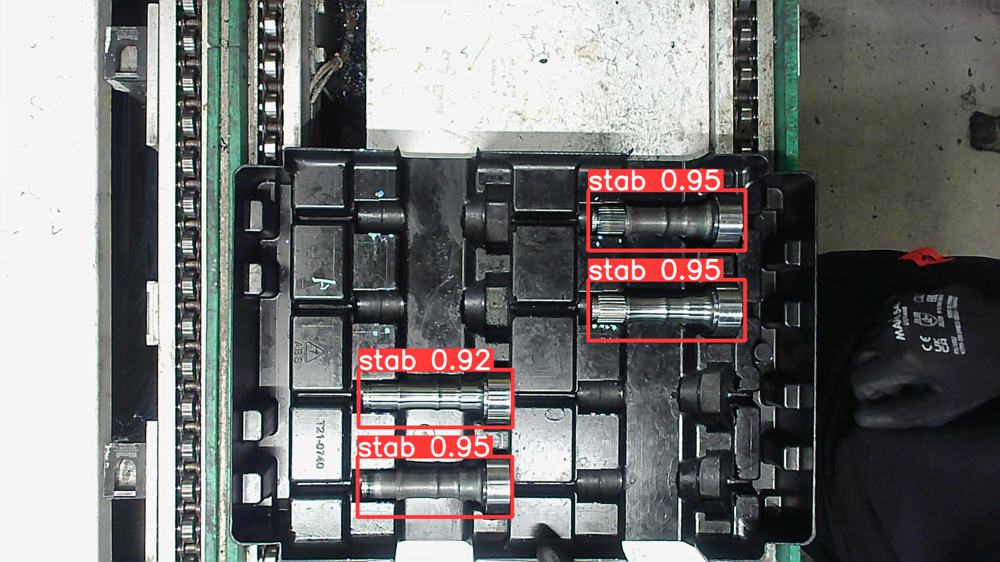

In [ ]:
import cv2
from google.colab.patches import cv2_imshow
import numpy as np

# Załaduj obraz wejściowy
image = cv2.imread('data/obj_train_data/image_281.png')

results = model(image)
annotated_frame = results[0].plot()

# Display the annotated frame
cv2_imshow(annotated_frame)